<a href="https://colab.research.google.com/github/Aryan-IIT/es335-24-fall-assignment-2/blob/main/Task4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# IMPORTING RELEVANT LIBRARIES

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import os
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [3]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# IMPORTING AND PREPROCESSING IMAGE

In [ ]:
import requests

response = requests.get('https://images.unsplash.com/photo-1545063914-a1a6ec821c88?q=80&w=2070&auto=format&fit=crop&ixlib=rb-4.0.3&ixid=M3wxMjA3fDB8MHxwaG90by1wYWdlfHx8fGVufDB8fHx8fA%3D%3D')

if response.status_code == 200:
    with open('deer.jpg', 'wb') as f:
        f.write(response.content)
    print('deer.jpg downloaded')
else:
    print('Failed to download image')

deer.jpg downloaded


Reading image using torchvision

In [ ]:
import torchvision # library used for computer vision tasks
img = torchvision.io.read_image("deer.jpg") # reading image using torchvision
print(img.shape) # prints shape of the image after conversion to PyTorch tensor

torch.Size([3, 1380, 2070])


Cropping image

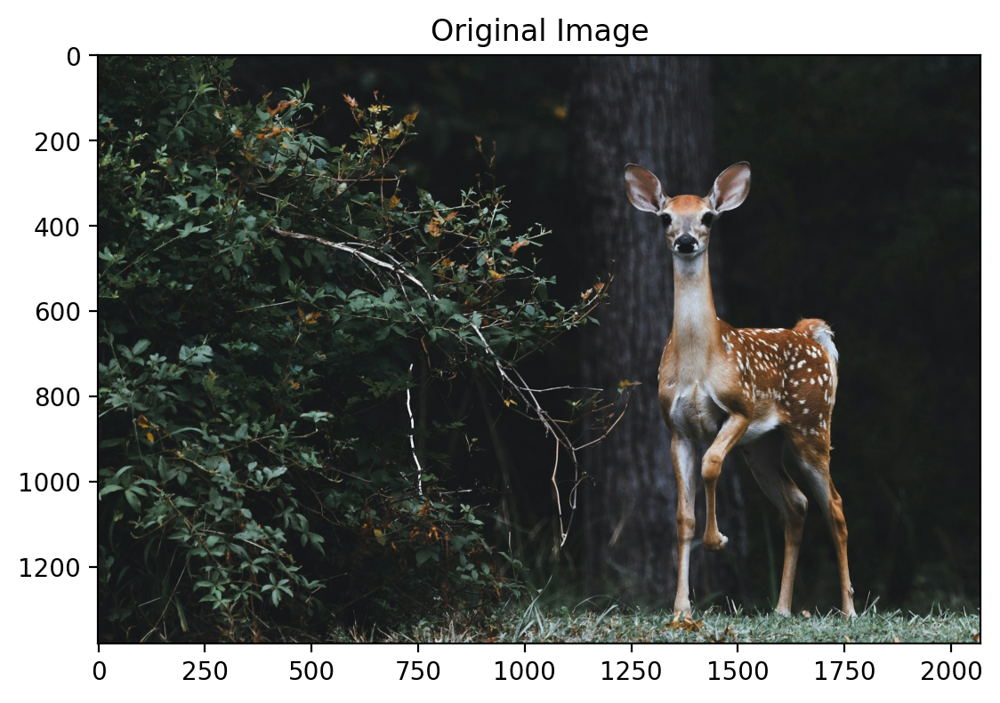

In [ ]:
img_np = img.numpy()
img_np = np.transpose(img_np, (1, 2, 0))
plt.imshow(img_np)
plt.title("Original Image")
plt.show()

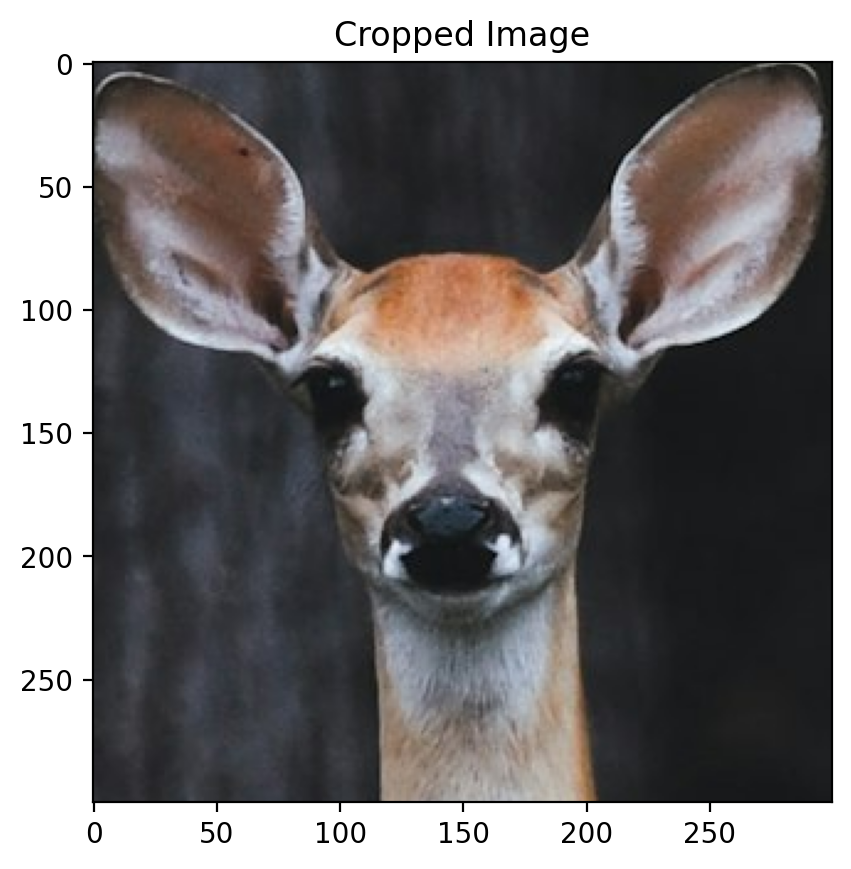

In [ ]:
crop = torchvision.transforms.functional.crop(img, 250, 1235, 300, 300)
crop_np = crop.numpy()
crop_np = np.transpose(crop_np, (1, 2, 0))
plt.imshow(crop_np)
plt.title("Cropped Image")
plt.show()

In [ ]:
crop.shape

torch.Size([3, 300, 300])

Splitting the image into the r, g and b channels

In [ ]:
crop = crop.float()/255 # converting image to tensor with float type so that nan can be stored later

In [ ]:
print(crop.shape)

torch.Size([3, 300, 300])


In [ ]:
crop_r = crop[0]
crop_g = crop[1]
crop_b = crop[2]

Masking the image

In [5]:
def mask_image(img, prop):
  img_copy = img.clone() # cloning original image
  mask = torch.rand(img_copy.shape) < prop # creating a mask with the same shape as the original image
  img_copy[mask] = float('nan') # masking the image with NaN values
  return img_copy, mask # returning the masked image and the mask
def masking(img, mask):
  img_copy = img.clone() # cloning original image
  img_copy[mask] = float('nan') # masking the image with NaN values
  return img_copy # returning the masked image

In [ ]:
masked_r_3, mask_3 = mask_image(crop_r, 0.3) # masking the image with 30% of the pixels
masked_g_3 = masking(crop_g, mask_3) # using the mask we created for red for green and blue channels too
masked_b_3 = masking(crop_b, mask_3)
masked_r_5, mask_5 = mask_image(crop_r, 0.5)
masked_g_5 = masking(crop_g, mask_5)
masked_b_5 = masking(crop_b, mask_5)
masked_r_7, mask_7 = mask_image(crop_r, 0.7)
masked_g_7 = masking(crop_g, mask_7)
masked_b_7 = masking(crop_b, mask_7)

Matrix factorization

In [4]:
def factorize(A, k, device=torch.device("cpu")):
    """Factorize the matrix D into A and B"""
    A = A.to(device)
    # Randomly initialize A and B
    W = torch.randn(A.shape[0], k, requires_grad=True, device=device)
    H = torch.randn(k, A.shape[1], requires_grad=True, device=device)
    # Optimizer
    optimizer = optim.Adam([W, H], lr=0.01)
    mask = ~torch.isnan(A)
    # training the model
    for i in range(1000):
        diff_matrix = torch.mm(W, H) - A # calculating loss
        diff_vector = diff_matrix[mask]
        loss = torch.norm(diff_vector)
        optimizer.zero_grad() # zero the gradients
        loss.backward() # backpropogate
        optimizer.step() # optimizing

    return W, H, loss

def display_rgb(img_r, img_g, img_b):
  img = torch.stack([img_r, img_g, img_b], dim=0) * 255
  img = torch.clamp(img, 0, 255)
  img = img.to(dtype=torch.uint8)
  img = img.permute(1, 2, 0).cpu().numpy()
  # img = img.numpy()
  # img = np.transpose(img, (1, 2, 0))
  return img

def reconstruct(A_r, A_g, A_b, k, device=torch.device("cpu")):
    W_r, H_r, loss_r = factorize(A_r, k, device) # factorization for r
    W_g, H_g, loss_g = factorize(A_g, k, device) # factorization for g
    W_b, H_b, loss_b = factorize(A_b, k, device) # factorization for b
    reconstructed_r = torch.mm(W_r, H_r) # reconstructed image after multiplying r
    reconstructed_g = torch.mm(W_g, H_g) # reconstructed image after multiplying g
    reconstructed_b = torch.mm(W_b, H_b) # reconstructed image after multiplying b
    reconstructed_img = display_rgb(reconstructed_r, reconstructed_g, reconstructed_b) # displaying the image
    return reconstructed_img

In [ ]:
reconstructed_3 = reconstruct(masked_r_3, masked_g_3, masked_b_3, 50, device)
reconstructed_5 = reconstruct(masked_r_5, masked_g_5, masked_b_5, 50, device)
reconstructed_7 = reconstruct(masked_r_7, masked_g_7, masked_b_7, 50, device)
display_masked_3 = display_rgb(masked_r_3, masked_g_3, masked_b_3)
display_masked_5 = display_rgb(masked_r_5, masked_g_5, masked_b_5)
display_masked_7 = display_rgb(masked_r_7, masked_g_7, masked_b_7)

In [ ]:
reconstructed = reconstruct(crop_r, crop_g, crop_b, 50, device)

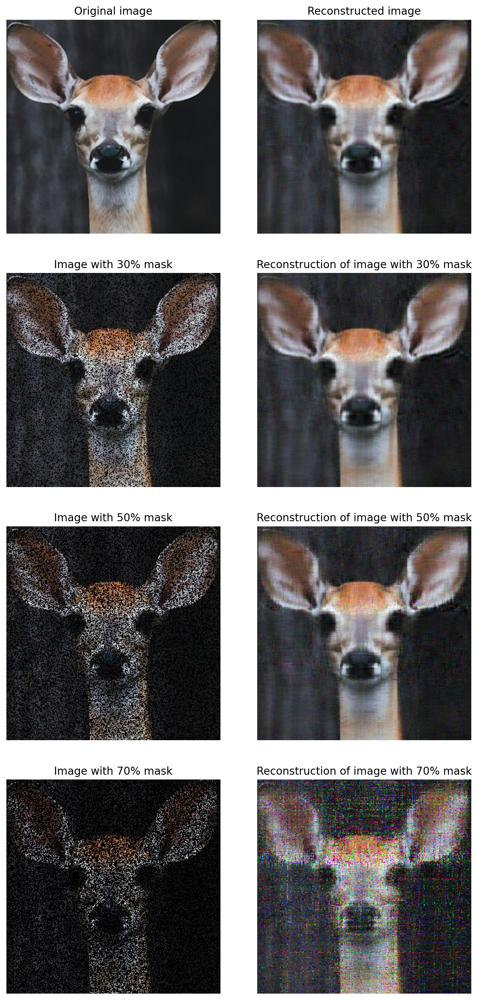

In [ ]:
figure, axes = plt.subplots(nrows=4,ncols=2,figsize=(8, 16))
figure.tight_layout()
axes[0][0].imshow(crop_np)
axes[0][0].axis('off')
axes[0][0].set_title('Original image')
axes[0][1].imshow(reconstructed)
axes[0][1].axis('off')
axes[0][1].set_title('Reconstructed image')
axes[1][0].imshow(display_masked_3)
axes[1][0].axis('off')
axes[1][0].set_title('Image with 30% mask')
axes[2][0].imshow(display_masked_5)
axes[2][0].axis('off')
axes[2][0].set_title('Image with 50% mask')
axes[3][0].imshow(display_masked_7)
axes[3][0].axis('off')
axes[3][0].set_title('Image with 70% mask')
axes[1][1].imshow(reconstructed_3)
axes[1][1].axis('off')
axes[1][1].set_title('Reconstruction of image with 30% mask')
axes[2][1].imshow(reconstructed_5)
axes[2][1].axis('off')
axes[2][1].set_title('Reconstruction of image with 50% mask')
axes[3][1].imshow(reconstructed_7)
axes[3][1].axis('off')
axes[3][1].set_title('Reconstruction of image with 70% mask')
plt.show()

Calculating RMSE and PSNR

$$RMSE=\sqrt{\frac{1}{n}\displaystyle\sum_{i=1}^n(I_{original,i​}−I_{reconstructed,i​})^2}$$
​

Where:

$I_{original}$ is the original image

$I_{reconstructed}$ is the reconstructed image

$n$ is the total number of pixels in the image

$$PSNR = 20\cdot log_{10} \left ( \dfrac{MAX_i}{RMSE}\right )$$

Where:

$MAX_I$ is the maximum possible pixel value, 255 in this case


In [6]:
def rmse(original, reconstructed):
  original_float = original.astype(np.float64)
  reconstructed_float = reconstructed.astype(np.float64)
  squared_diff = (original_float - reconstructed_float) ** 2
  mean_squared_diff = np.mean(squared_diff)
  return np.sqrt(mean_squared_diff)

def calc_rmse(original, reconstructed):
  original_r = original[0]
  original_g = original[1]
  original_b = original[2]
  reconstructed_r = reconstructed[0]
  reconstructed_g = reconstructed[1]
  reconstructed_b = reconstructed[2]
  rmse_r = rmse(original_r, reconstructed_r)
  rmse_g = rmse(original_g, reconstructed_g)
  rmse_b = rmse(original_b, reconstructed_b)
  rmse_total = (rmse_r + rmse_g + rmse_b) / 3
  return rmse_total

def psnr(original, reconstructed):
  rmse_r = rmse(original[0], reconstructed[0])
  rmse_g = rmse(original[1], reconstructed[1])
  rmse_b = rmse(original[2], reconstructed[2])
  psnr_r = 20 * np.log10(255 / rmse_r)
  psnr_g = 20 * np.log10(255 / rmse_g)
  psnr_b = 20 * np.log10(255 / rmse_b)
  psnr_sep = (psnr_r + psnr_g + psnr_b) / 3
  return psnr_sep

In [1]:
from prettytable import PrettyTable # importing a library to print a table

In [ ]:
table = PrettyTable() # crating table for storing rmse and psnr values
table.field_names = ["Image", "RMSE", "PSNR"]
table.add_row(["Original image", calc_rmse(crop_np, reconstructed), psnr(crop_np, reconstructed)])
table.add_row(["30% masked image", calc_rmse(crop_np, reconstructed_3), psnr(display_masked_3, reconstructed_3)])
table.add_row(["50% masked image", calc_rmse(crop_np, reconstructed_5), psnr(display_masked_5, reconstructed_5)])
table.add_row(["70% masked image", calc_rmse(crop_np, reconstructed_7), psnr(display_masked_7, reconstructed_7)])

In [ ]:
print(table)

+------------------+--------------------+--------------------+
|      Image       |        RMSE        |        PSNR        |
+------------------+--------------------+--------------------+
|  Original image  | 12.270010964169769 | 26.36865852201888  |
| 30% masked image | 13.328484914373549 | 19.11738172774299  |
| 50% masked image | 14.621608515812868 | 17.06863900816052  |
| 70% masked image |  37.3680542431832  | 13.202692578596645 |
+------------------+--------------------+--------------------+


# EFFECT OF CHANGING RANK ON IMAGE RECONSTRUCTION

## PERFORMANCE OF DIFFERENT RANKS ON RECONSTRUCTION OF UNMASKED IMAGE

In [ ]:
ranks = [5, 15, 25, 35, 45, 55, 65, 75, 85, 95, 105, 115, 125, 135, 145, 155]  # list of ranks to try
results = {}  # dictionary to store results
for rank in ranks:
    reconstructed_img = reconstruct(crop_r, crop_g, crop_b, rank, device)  # reconstructing image using current rank
    rmsee = calc_rmse(crop_np, reconstructed_img)  # calculating RMSE
    psnrr = psnr(crop_np, reconstructed_img)  # calculating PSNR
    results[rank] = {'rmse': rmsee, 'psnr': psnrr} # string results

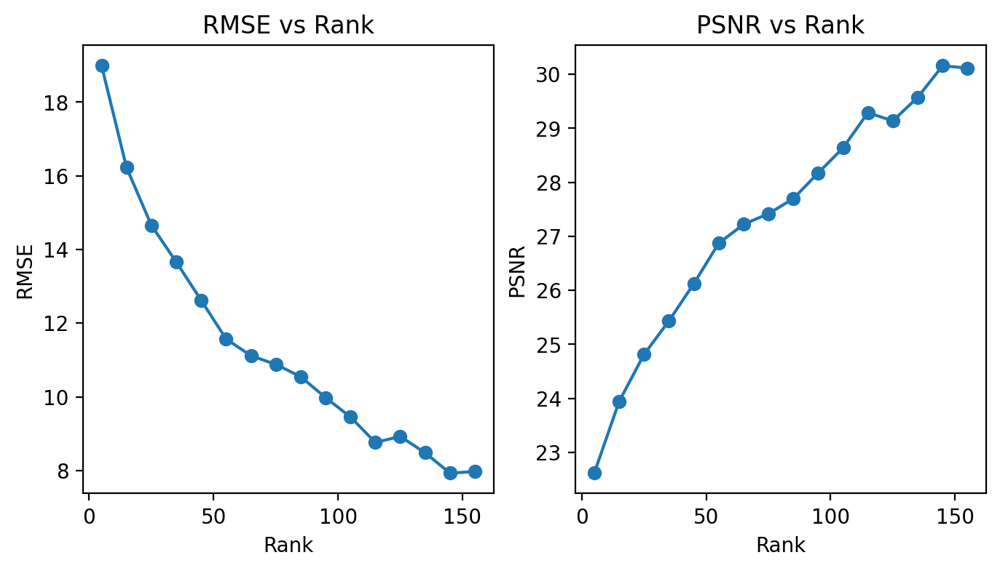

In [ ]:
figure, axes = plt.subplots(nrows=1,ncols=2,figsize=(8, 4))
axes[0].plot(ranks, [result['rmse'] for result in results.values()], marker='o')
axes[0].set_xlabel('Rank')
axes[0].set_ylabel('RMSE')
axes[0].set_title('RMSE vs Rank')
axes[1].plot(ranks, [result['psnr'] for result in results.values()], marker='o')
axes[1].set_xlabel('Rank')
axes[1].set_ylabel('PSNR')
axes[1].set_title('PSNR vs Rank')
plt.show()

## PERFORMANCE OF DIFFERENT RANKS ON RECONSTRUCTION OF MASKED IMAGE

In [ ]:
ranks = [5, 15, 25, 35, 45, 55, 65, 75, 85, 95, 105, 115, 125, 135, 145, 155]  # list of ranks to try
results = {}  # dictionary to store results
for rank in ranks:
    reconstructed_img = reconstruct(masked_r_3, masked_g_3, masked_b_3, rank, device)  # reconstructing image using current rank
    rmsee = calc_rmse(crop_np, reconstructed_img)  # calculating RMSE
    psnrr = psnr(crop_np, reconstructed_img)  # calculating PSNR
    results[rank] = {'rmse': rmsee, 'psnr': psnrr} # string results

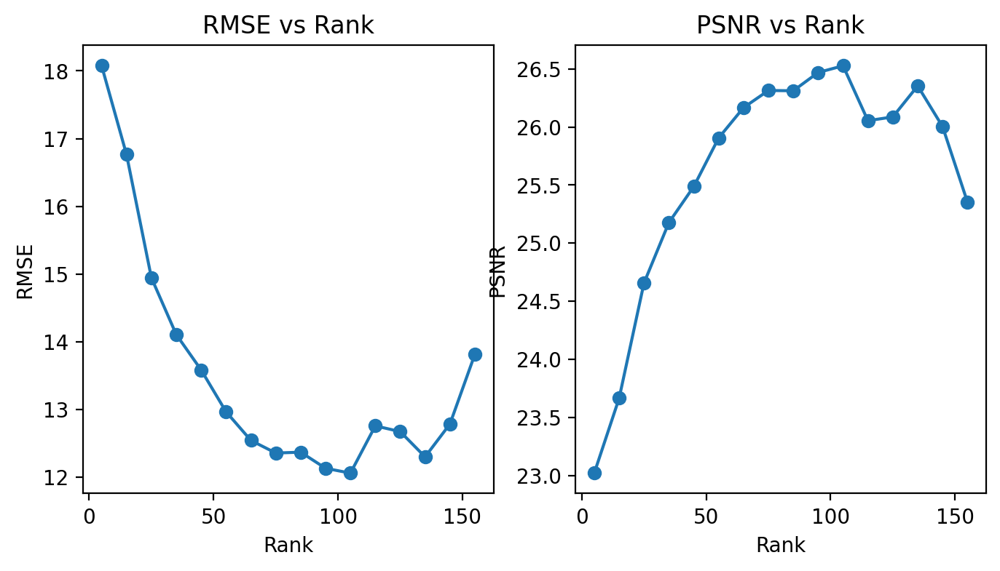

In [ ]:
figure, axes = plt.subplots(nrows=1,ncols=2,figsize=(8, 4))
axes[0].plot(ranks, [result['rmse'] for result in results.values()], marker='o')
axes[0].set_xlabel('Rank')
axes[0].set_ylabel('RMSE')
axes[0].set_title('RMSE vs Rank')
axes[1].plot(ranks, [result['psnr'] for result in results.values()], marker='o')
axes[1].set_xlabel('Rank')
axes[1].set_ylabel('PSNR')
axes[1].set_title('PSNR vs Rank')
plt.show()

# REMOVING A RANDOM PATCH FROM THE IMAGE

In [7]:
from sklearn.kernel_approximation import RBFSampler
from sklearn.linear_model import LinearRegression

In [8]:
import requests

response = requests.get('https://images.unsplash.com/photo-1458682625221-3a45f8a844c7')

if response.status_code == 200:
    with open('pattern.jpg', 'wb') as f:
        f.write(response.content)
    print('pattern.jpg downloaded')
else:
    print('Failed to download image')

pattern.jpg downloaded


In [9]:
import torchvision # library used for computer vision tasks
image = torchvision.io.read_image("pattern.jpg") # reading image using torchvision
print(image.shape) # prints shape of the image after conversion to PyTorch tensor

torch.Size([3, 3366, 4488])


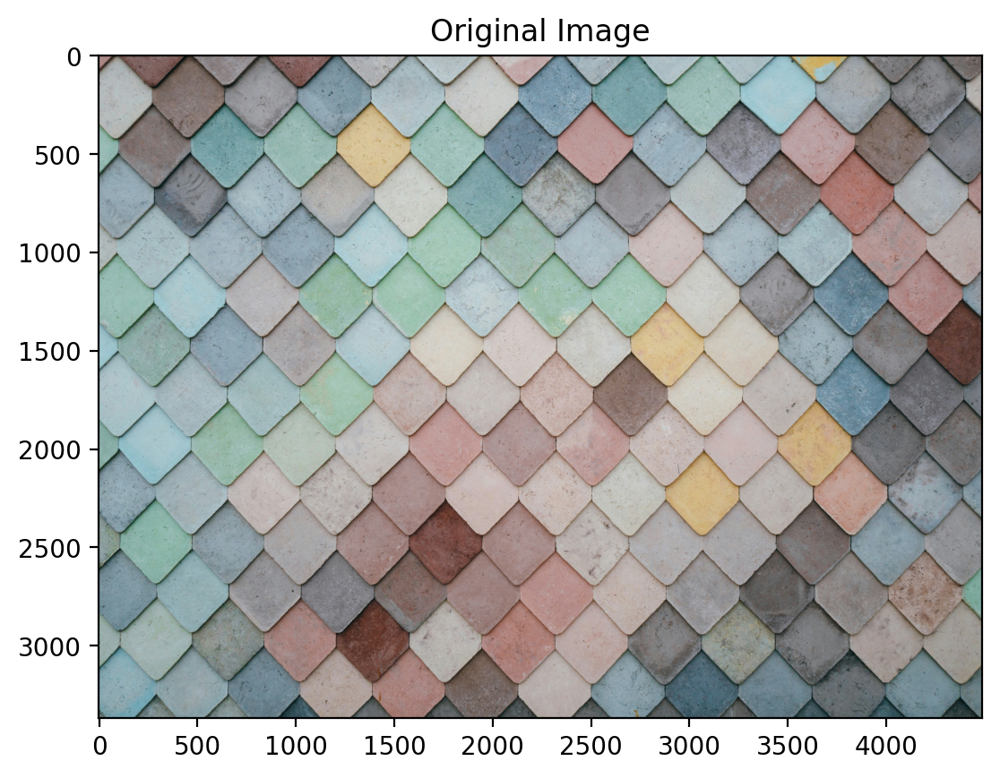

In [10]:
image_np = image.numpy()
image_np = np.transpose(image_np, (1, 2, 0))
plt.imshow(image_np)
plt.title("Original Image")
plt.show()

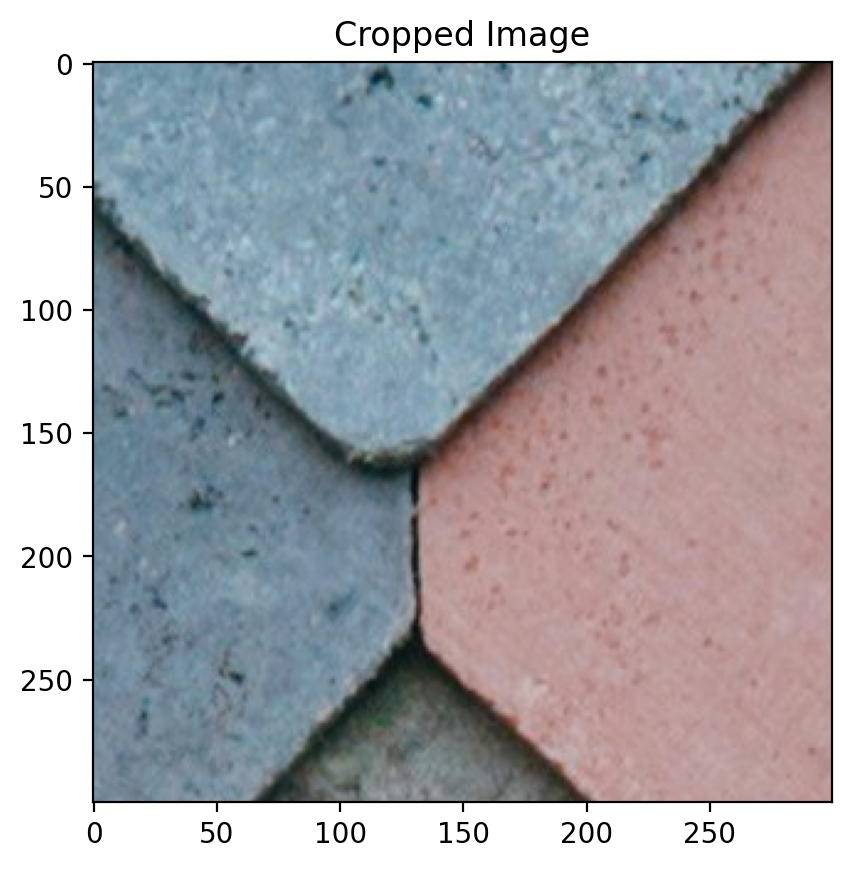

In [11]:
cropped = torchvision.transforms.functional.crop(image, 250, 2200, 300, 300)
cropped_np = cropped.numpy()
cropped_np = np.transpose(cropped_np, (1, 2, 0))
plt.imshow(cropped_np)
plt.title("Cropped Image")
plt.show()

In [12]:
cropped = cropped.float()/255

In [13]:
cropped_r = cropped[0]
cropped_g = cropped[1]
cropped_b = cropped[2]

In [14]:
img_altered = cropped.clone()
height = 300
width = 300
top = torch.randint(0, width - 30 + 1, (1,)).item() # top left corner of the patch, setting boundaries for randint
left = torch.randint(0, height - 30 + 1, (1,)).item() # to ensure patch is completely inside the image
mask = torch.zeros(cropped_r.shape, dtype=torch.bool)
mask[left:left+30, top:top+30] = True # creating a mask with the same shape as the original image
img_altered_r = img_altered[0]
img_altered_g = img_altered[1]
img_altered_b = img_altered[2]
masked_altered_r = masking(img_altered_r, mask)
masked_altered_g = masking(img_altered_g, mask)
masked_altered_b = masking(img_altered_b, mask)
display_altered = display_rgb(masked_altered_r, masked_altered_g, masked_altered_b)

## RECONSTRUCTING IMAGE USING MATRIX FACTORIZATION AND GRADIENT DESCENT

In [27]:
recon_alt = reconstruct(masked_altered_r, masked_altered_g, masked_altered_b, 50, device)

## RECONSTRUCTING IMAGE USING RFF AND LINEAR REGRESSION

## TUNING HYPERPARAMETERS

In [15]:
crop_1_r = display_altered[:, :, 0] # splitting into three channels
crop_1_g = display_altered[:, :, 1]
crop_1_b = display_altered[:, :, 2]
pixels_r = crop_1_r.flatten() # flattening into 1D
pixels_g = crop_1_g.flatten()
pixels_b = crop_1_b.flatten()

In [19]:
cropped_for_use_calc = cropped_np.copy()
cropped_for_use_calc = np.transpose(cropped_for_use_calc, (2, 0, 1))

In [20]:
gamma_vals = [0.01, 0.1, 1, 10]
n_components_vals = [100, 250, 500, 750, 1000, 1250]
table2 = PrettyTable() # crating table for storing rmse and psnr values
table2.field_names = ["Gamma", "Number of components", "RMSE", "PSNR"]
for gamma in gamma_vals:
  for n_components in n_components_vals:
    coords = np.array([[i, j] for i in range(300) for j in range(300)]) # pixel corrds correspond to the input, height = 300, width = 300
    rff = RBFSampler(gamma=gamma, n_components=n_components, random_state=42)
    rff_features = rff.fit_transform(coords)  # transform pixel coordinates to RFF space
    lr = LinearRegression() # linear regression model
    lr.fit(rff_features, pixels_r) # fitting the model
    reconstructed_pixels_r = lr.predict(rff_features) # predicting pixel intensities
    reconstructed_image_r = reconstructed_pixels_r.reshape(300, 300) # reshaping the image
    lr.fit(rff_features, pixels_g)
    reconstructed_pixels_g = lr.predict(rff_features)
    reconstructed_image_g = reconstructed_pixels_g.reshape(300, 300)
    lr.fit(rff_features, pixels_b)
    reconstructed_pixels_b = lr.predict(rff_features)
    reconstructed_image_b = reconstructed_pixels_b.reshape(300, 300)
    recon_rfff = np.stack([reconstructed_image_r, reconstructed_image_g, reconstructed_image_b], axis=0) # stacking r, g and b
    recon_rff = np.clip(recon_rfff, 0, 255) # clipping just in case
    recon_rff = np.round(recon_rff).astype(np.uint8) # rounding off to nearest integer
    rmse_val = calc_rmse(cropped_for_use_calc, recon_rff)
    psnr_val = psnr(cropped_for_use_calc, recon_rff)
    table2.add_row([gamma, n_components, rmse_val, psnr_val]) # for printing rmse and psnr values

In [17]:
print(cropped_np.shape)
print(recon_rff.shape)

(300, 300, 3)
(3, 300, 300)


In [22]:
coords = np.array([[i, j] for i in range(300) for j in range(300)]) # pixel corrds correspond to the input, height = 300, width = 300
rff = RBFSampler(gamma=0.01, n_components=1500, random_state=42) # getting 125 0 random fourier features
# gamma: controls bandwidth of created fourier features
rff_features = rff.fit_transform(coords)  # transform pixel coordinates to RFF space
lr = LinearRegression() # linear regression model
lr.fit(rff_features, pixels_r) # fitting the model
reconstructed_pixels_r = lr.predict(rff_features) # predicting pixel intensities
reconstructed_image_r = reconstructed_pixels_r.reshape(300, 300) # reshaping the image
lr.fit(rff_features, pixels_g)
reconstructed_pixels_g = lr.predict(rff_features)
reconstructed_image_g = reconstructed_pixels_g.reshape(300, 300)
lr.fit(rff_features, pixels_b)
reconstructed_pixels_b = lr.predict(rff_features)
reconstructed_image_b = reconstructed_pixels_b.reshape(300, 300)
recon_rfff = np.stack([reconstructed_image_r, reconstructed_image_g, reconstructed_image_b], axis=0) # stacking r, g and b
rmse_cc = calc_rmse(cropped_for_use_calc, recon_rfff)
psnr_cc = psnr(cropped_for_use_calc, recon_rfff)
table2.add_row([0.01, 1500, rmse_cc, psnr_cc])

In [23]:
print(table2)

+-------+----------------------+--------------------+--------------------+
| Gamma | Number of components |        RMSE        |        PSNR        |
+-------+----------------------+--------------------+--------------------+
|  0.01 |         100          | 26.786572608416943 | 19.588883291917544 |
|  0.01 |         250          | 29.523510867405083 | 18.805189781488664 |
|  0.01 |         500          | 19.367984066782977 | 22.411535345106973 |
|  0.01 |         750          | 18.475917587573548 | 22.82190080632932  |
|  0.01 |         1000         | 17.977150582013877 | 23.061368278498197 |
|  0.01 |         1250         | 17.791393944569606 | 23.15272441629627  |
|  0.1  |         100          | 32.087941608785336 | 18.065246808040502 |
|  0.1  |         250          | 33.390589123287135 | 17.74359330031019  |
|  0.1  |         500          | 28.637467476887853 | 19.008965175999403 |
|  0.1  |         750          | 29.87110375356586  | 18.66985667949888  |
|  0.1  |         1000   

## FINAL IMAGE RECONSTRUCTION USING TUNED HYPERPARAMETERS

In [24]:
coords = np.array([[i, j] for i in range(300) for j in range(300)]) # pixel corrds correspond to the input, height = 300, width = 300
rff = RBFSampler(gamma=0.01, n_components=1250, random_state=42) # getting 125 0 random fourier features
# gamma: controls bandwidth of created fourier features
rff_features = rff.fit_transform(coords)  # transform pixel coordinates to RFF space
lr = LinearRegression() # linear regression model
lr.fit(rff_features, pixels_r) # fitting the model
reconstructed_pixels_r = lr.predict(rff_features) # predicting pixel intensities
reconstructed_image_r = reconstructed_pixels_r.reshape(300, 300) # reshaping the image
lr.fit(rff_features, pixels_g)
reconstructed_pixels_g = lr.predict(rff_features)
reconstructed_image_g = reconstructed_pixels_g.reshape(300, 300)
lr.fit(rff_features, pixels_b)
reconstructed_pixels_b = lr.predict(rff_features)
reconstructed_image_b = reconstructed_pixels_b.reshape(300, 300)
recon_rfff = np.stack([reconstructed_image_r, reconstructed_image_g, reconstructed_image_b], axis=0) # stacking r, g and b

In [25]:
recon_rff = np.clip(recon_rfff, 0, 255) # clipping just in case
recon_rff = np.round(recon_rff).astype(np.uint8) # rounding off to nearest integer
recon_rff = np.transpose(recon_rff, (1, 2, 0)) # putting in the correct order for imshow()

In [30]:
recon_alt_calc = np.transpose(recon_alt, (2, 0, 1))
recon_rff_calc = np.transpose(recon_rff, (2, 0, 1))
cropped_np_calc = np.transpose(cropped_np, (2, 0, 1))

In [31]:
table1 = PrettyTable() # crating table for storing rmse and psnr values
table1.field_names = ["Technique Used", "RMSE", "PSNR"]
table1.add_row(["Matrix factorisation and gradient descent", calc_rmse(cropped_np_calc, recon_alt_calc), psnr(cropped_np_calc, recon_alt_calc)])
table1.add_row(["Linear regression with RFF", calc_rmse(cropped_np_calc, recon_rff_calc), psnr(cropped_np_calc, recon_rff_calc)])

# COMPARISON OF MATRIX FACTORIZATION WITH GRADIENT DESCENT AND LINEAR REGRESSION WITH RFF

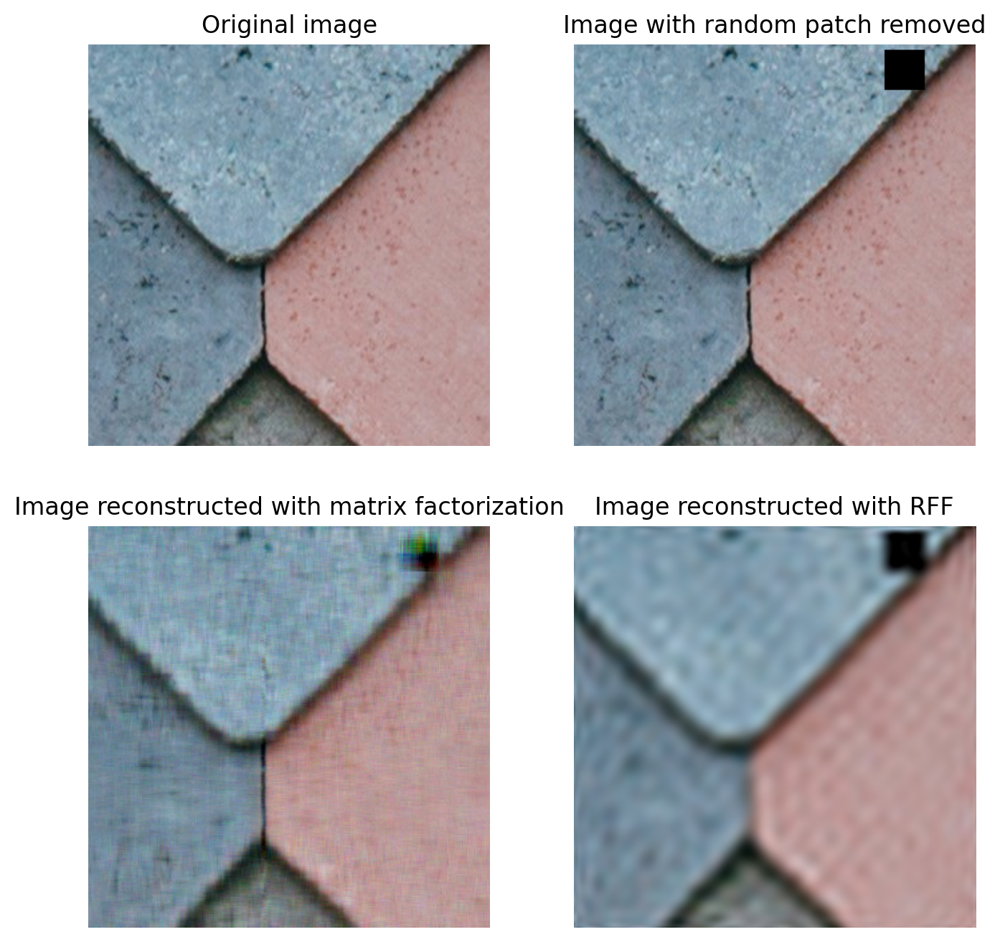

In [33]:
figure, axes = plt.subplots(nrows=2,ncols=2,figsize=(8, 8))
axes[0][0].imshow(cropped_np)
axes[0][0].axis('off')
axes[0][0].set_title('Original image')
axes[0][1].imshow(display_altered)
axes[0][1].axis('off')
axes[0][1].set_title('Image with random patch removed')
axes[1][0].imshow(recon_alt)
axes[1][0].axis('off')
axes[1][0].set_title('Image reconstructed with matrix factorization')
axes[1][1].imshow(recon_rff)
axes[1][1].axis('off')
axes[1][1].set_title('Image reconstructed with RFF')
plt.show()

In [32]:
print(table1)

+-------------------------------------------+--------------------+-------------------+
|               Technique Used              |        RMSE        |        PSNR       |
+-------------------------------------------+--------------------+-------------------+
| Matrix factorisation and gradient descent | 12.671948607193576 | 26.09138483002246 |
|         Linear regression with RFF        | 17.791393944569606 | 23.15272441629627 |
+-------------------------------------------+--------------------+-------------------+
